In [13]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
from pathlib import Path
import scipy.io as sio
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
import cv2

PROJECT_ROOT = Path.cwd().parent

# 1. Data

## 1.1 Raw data inspection

In [4]:
data_path = PROJECT_ROOT /"data/raw/"
data_id = '019'#'348'#"204"
image_path = data_path / (data_id + ".tiff")
coord_path = data_path / (data_id + "_coords.mat")

**Note**: As coords collected in matlab, indexing starts with 1 and not with 0 => For inspecting the correct coords in python, indices need a subtraction by 1.

In [5]:
# Read and process coordinate data
# Read data
coord_data = sio.loadmat(coord_path)

# Inspect available variables
print(coord_data.keys())

# Get coordinates and rectangle position
coords = np.round(coord_data["coords"]).astype(int)      # shape: (N, 2)
if len(coords) > 0:
    coords -= 1 # Indexing from matlab format to python format
    x = coords[:,0]
    y = coords[:,1]
else:
    x, y = None, None

# Get ROI
rectPos = coord_data["rectPos"]
rect_x, rect_y, rect_w, rect_h = rectPos[0]
rect_x -= 1 # Indexing from matlab format to python format
rect_y -= 1

# Discretize ROI such that it does not shrink and Ws and Hs stay equal across ROIs
rect_x = int(max(np.floor(rect_x),0))
rect_y = int(max(np.floor(rect_y),0))
rect_w = int(np.ceil(rect_w) + 1) # +1 to make sure that flooring lower bounds is no greater shift than ceiling dimensions
rect_h = int(np.ceil(rect_h) + 1)

dict_keys(['__header__', '__version__', '__globals__', 'coords', 'rectPos'])


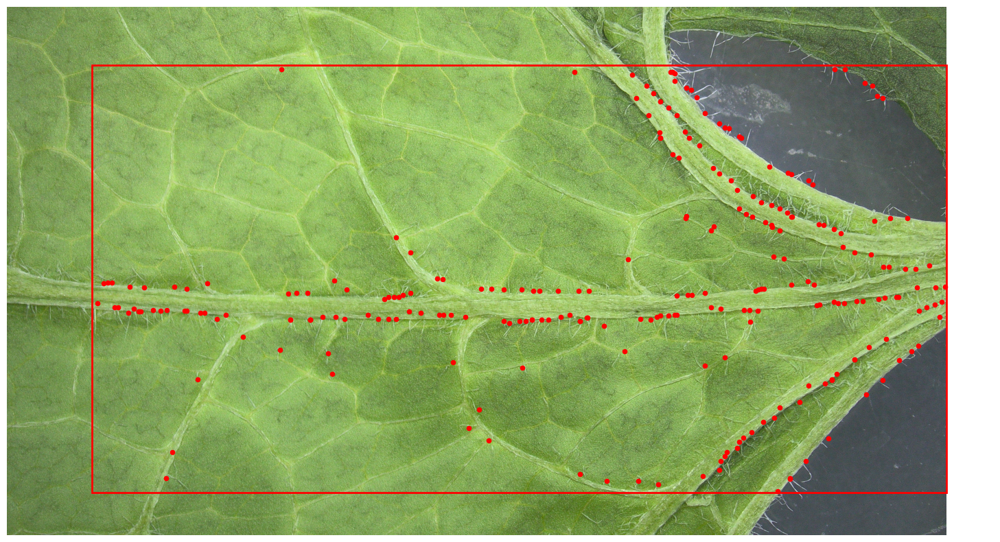

In [6]:
# Load image and plot it with coordinates
# Load image
img = cv2.imread(str(image_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Plot image and coords
fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(img)
ax.scatter(x, y, s=20, c="red", marker="o")
ax.add_patch(
    Rectangle(
        (rect_x, rect_y), rect_w, rect_h,
        fill=False,
        edgecolor="red",
        linewidth=2
    )
)
plt.axis("off")
plt.show()

Only ROI inspection:

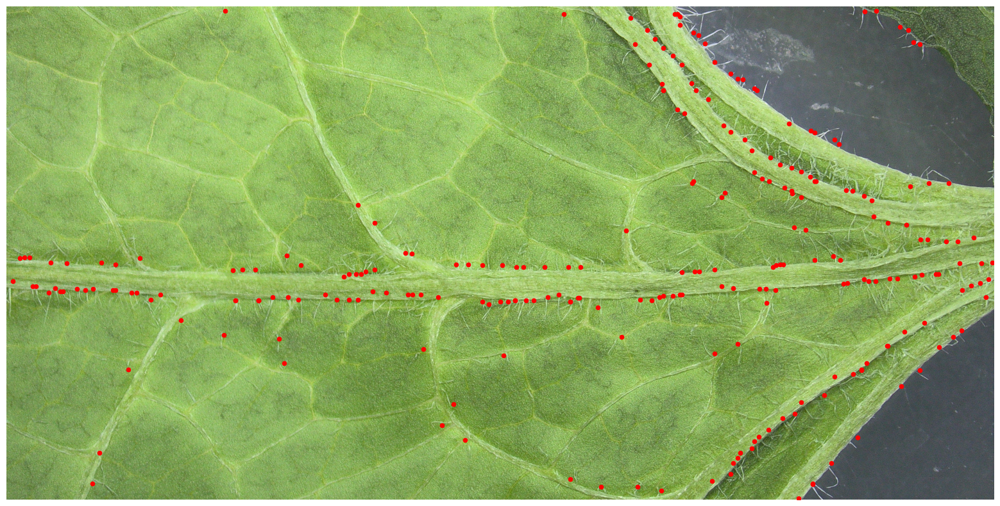

In [7]:
# Cutout ROI
new_img = img[rect_y:rect_y+rect_h,rect_x:rect_x+rect_w,:]
if len(coords) > 0:
    x = coords[:,0]
    y = coords[:,1]
    x -= rect_x
    y -= rect_y
else:
    x, y = None, None

# Plot image and coords
fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(new_img)
ax.scatter(x, y, s=20, c="red", marker="o")
plt.axis("off")
plt.show()

**Note**: Coordinate labels do not reflect trichome positions perfectly => Noisy labels

## 1.2 Data processing

In [9]:
from trichomecounter.data.data_setup import process_dataset

try:
    process_dataset(
        raw_root=PROJECT_ROOT / "data/raw",
        out_root=PROJECT_ROOT / "data/processed",
    )
except FileExistsError:
    print("...processing paths already exist. Delete manually if processing should be redone.")

Processing train data...
...processing paths already exist. Delete manually if processing should be redone.


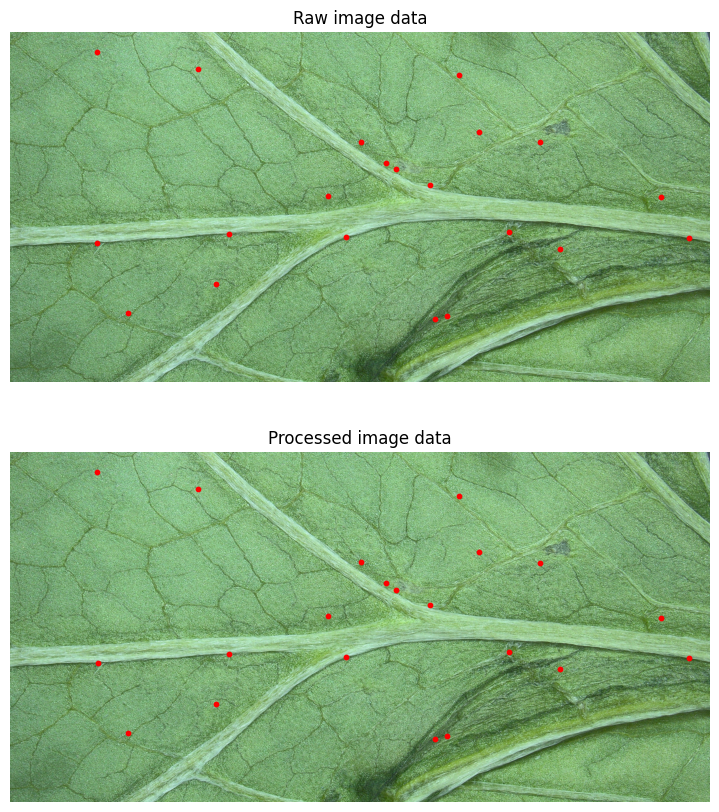

In [16]:
# Sanity check: Compare raw data to processed data
from trichomecounter.utils.utils import get_random_data_paths, load_processed_image_data, load_raw_image_data

# Get random data paths to raw and according processed images and coord data
image_path_raw, coord_path_raw, image_path_pre, coord_path_pre = get_random_data_paths()

# Compare raw and processed image in figure
fig, ax = plt.subplots(2,1,figsize=(10,10))

# Raw image
img_raw, rect_x, rect_y, rect_w, rect_h, coords_raw = load_raw_image_data(image_path_raw,coord_path_raw)

ax[0].imshow(img_raw)
if len(coords_raw) > 0:
    ax[0].scatter(coords_raw[:,0], coords_raw[:,1], s=10, c="red", marker="o")
ax[0].set_xlim(rect_x,rect_x+rect_w)
ax[0].set_ylim(rect_y+rect_h, rect_y)
ax[0].set_title("Raw image data")
ax[0].axis("off")

# Processed image
img_pre, coords_pre = load_processed_image_data(image_path_pre,coord_path_pre)

ax[1].imshow(img_pre)
if len(coords_pre) > 0:
    ax[1].scatter(coords_pre[:,0], coords_pre[:,1], s=10, c="red", marker="o")
ax[1].set_title("Processed image data")
ax[1].axis("off");

## 1.3 Data transformations

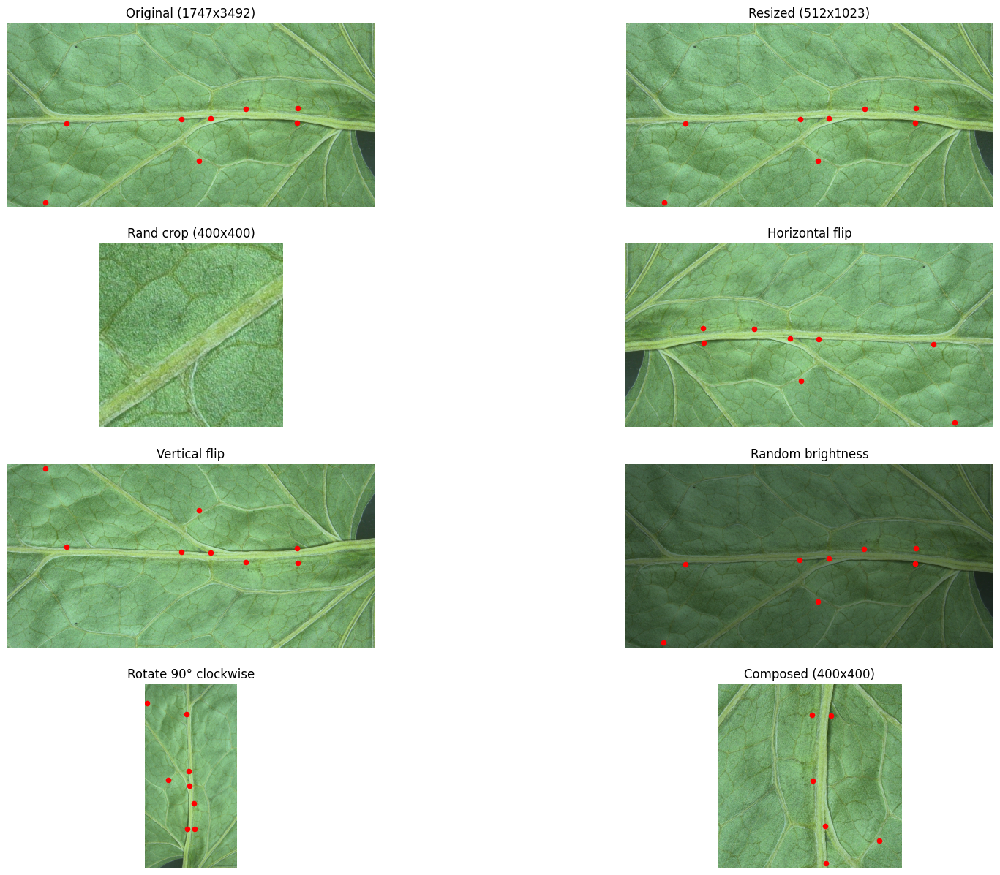

In [17]:
# Sanity check: Inspect transformation outcomes
from trichomecounter.utils.utils import get_random_data_paths
from trichomecounter.utils.visualizations import plot_image
from trichomecounter.data import data_transformations as transforms

# Get random image and coord paths
_, _, img_path, coord_path = get_random_data_paths()

# Load image and coordinates
img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
coords = np.load(coord_path)

# Get data into expected PyTorch data formats before transformation application
img = torch.from_numpy(img).permute(2, 0, 1).float() / 255.0
coords = torch.from_numpy(coords).float()
_,H,W = img.shape

# Compare untransformed and transformed data
fig, axs = plt.subplots(4,2,figsize=(20,15))

# Original image
plot_image(img, coords, title=f"Original ({H}x{W})", ax=axs[0,0])


# Resize image
short_side = 512
scale = short_side / min(H, W)
resize = transforms.ResizeShortSide(short_side)
img_new, coords_new = resize(img, coords)
plot_image(img_new, coords_new, title=f"Resized ({round(scale*H)}x{round(scale*W)})", ax=axs[0,1])

# Random crop
crop_w, crop_h = 400,400
crop = transforms.RandomCrop(crop_w, crop_h)
img_new, coords_new = crop(img, coords)
plot_image(img_new, coords_new, title=f"Rand crop ({crop_h}x{crop_w})", ax=axs[1,0])

# Random horizontal flip (p=1 => sure flip)
flip_horiz = transforms.RandomHorizontalFlip(1)
img_new, coords_new = flip_horiz(img, coords)
plot_image(img_new, coords_new, title="Horizontal flip", ax=axs[1,1])

# Random vertical flip (p=1 => sure flip)
flip_vert = transforms.RandomVerticalFlip(1)
img_new, coords_new = flip_vert(img, coords) 
plot_image(img_new, coords_new, title="Vertical flip", ax=axs[2,0])

# Random brightness change
change_bright = transforms.RandomBrightness(0.5)
img_new, coords_new = change_bright(img, coords) 
plot_image(img_new, coords_new, title="Random brightness", ax=axs[2,1])

# Random rotation (p=1 => sure rotation)
rotate = transforms.RandomRotate90(1)
img_new, coords_new = rotate(img, coords) 
plot_image(img_new, coords_new, title="Rotate 90° clockwise", ax=axs[3,0])

# Composition: Resize -> Crop -> Flip horiz -> Flip vert -> Rotate -> Change_Brightness
comp = transforms.Compose([resize, crop, flip_horiz, flip_vert, rotate, change_bright])
img_new, coords_new = comp(img, coords)
plot_image(img_new, coords_new, title=f"Composed ({crop_h}x{crop_w})", ax=axs[3,1])